In [ ]:
import random
random.seed(0)
import numpy as np
np.random.seed(0)
import tensorflow as tf
tf.random.set_seed(0)

In [ ]:
!pip install matplotlib-venn
!pip install tensorflow

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.animation as animation

In [ ]:
from tqdm import tqdm_notebook as tqdm
from __future__ import print_function
import argparse
import pandas as pd
from PIL import Image
import glob
import imageio
import cv2
import pathlib
import sys
from skimage import io, transform
from IPython import display
from IPython.display import HTML

In [ ]:
import os
import json
from zipfile import ZipFile
from __future__ import print_function
import time

In [ ]:
import torch
from torch import nn, optim
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.autograd import Variable
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, ConcatDataset, TensorDataset
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

In [ ]:
import torchvision
import torchvision.datasets as dset
from torchvision import datasets, transforms
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import torchvision.utils as vutils
from torchvision.datasets import MNIST
from torchvision.utils import save_image

In [ ]:
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [ ]:
def get_default_device():
    if torch.cuda.is_available():
        print("CUDA is available. Using GPU.")
        return torch.device('cuda')
    else:
        print("CUDA is not available. Using CPU.")
        return torch.device('cpu')

device = get_default_device()

def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

CUDA is available. Using GPU.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
kaggle_credentails= json.load(open("/content/drive/MyDrive/kaggle.json"))

In [ ]:
os.environ['KAGGLE_USERNAME'] = kaggle_credentails['username']
os.environ['KAGGLE_KEY'] = kaggle_credentails['key']

In [ ]:
!kaggle datasets download -d ashfakyeafi/brain-mri-images

Dataset URL: https://www.kaggle.com/datasets/ashfakyeafi/brain-mri-images
License(s): apache-2.0
 97% 338M/348M [00:06<00:00, 31.3MB/s]
100% 348M/348M [00:06<00:00, 56.1MB/s]


In [ ]:
from zipfile import ZipFile
with ZipFile("/content/brain-mri-images.zip",'r') as zip_ref:
  zip_ref.extractall()
print(os.listdir("/content/GAN-Traning Images"))

['OAS2_0054_MR1_z_slice_144.jpg', 'Tr-no_0481.jpg', 'Tr-gl_1265.jpg', 'Tr-pi_0069.jpg', 'Tr-me_1200.jpg', 'Tr-me_0226.jpg', 'OAS2_0007_MR3_x_slice_104.jpg', 'Tr-pi_1068.jpg', 'Tr-pi_0740.jpg', 'OAS2_0128_MR1_z_slice_135.jpg', 'Tr-me_0877.jpg', 'Tr-me_0838.jpg', 'OAS2_0171_MR2_x_slice_107.jpg', 'OAS2_0157_MR2_z_slice_137.jpg', 'Te-pi_0115.jpg', 'Tr-me_0351.jpg', 'OAS2_0051_MR2_z_slice_142.jpg', 'OAS2_0042_MR2_z_slice_136.jpg', 'Tr-me_0595.jpg', 'OAS2_0022_MR1_x_slice_150.jpg', 'Tr-me_0887.jpg', 'Tr-gl_0408.jpg', 'OAS2_0141_MR1_y_slice_142.jpg', 'OAS2_0144_MR1_y_slice_126.jpg', 'OAS2_0073_MR5_y_slice_117.jpg', 'OAS2_0103_MR3_z_slice_150.jpg', 'Tr-me_0801.jpg', 'Tr-no_1310.jpg', 'Tr-pi_0743.jpg', 'OAS2_0058_MR1_x_slice_124.jpg', 'OAS2_0034_MR1_y_slice_123.jpg', 'Tr-no_0206.jpg', 'OAS2_0131_MR1_z_slice_105.jpg', 'Tr-no_1059.jpg', 'Te-me_0273.jpg', 'Tr-gl_1263.jpg', 'OAS2_0041_MR3_z_slice_128.jpg', 'Te-me_0167.jpg', 'Tr-pi_1122.jpg', 'Tr-no_1121.jpg', 'OAS2_0034_MR1_z_slice_148.jpg', 'OAS2_

In [ ]:
print("Length of directory : ",len(os.listdir("/content/GAN-Traning Images")))

Length of directory :  14715


In [ ]:
def preprocess_image(img_path):
    img = cv2.imread(img_path)

    if img is None:
        print(f"Error: Could not load image at {img_path}. Please check the file path.")
        return None

    # Converting to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Denoising the image
    denoised_img = cv2.fastNlMeansDenoising(gray_img, None, 20, 3, 21)

    # Sharpening using a custom kernel
    kernel_sharpen = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    sharpened_img = cv2.filter2D(denoised_img, -1, kernel_sharpen)

    return sharpened_img

In [ ]:
def preprocess_dataset(image_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for img_name in os.listdir(image_dir):
        img_path = os.path.join(image_dir, img_name)
        processed_img = preprocess_image(img_path)

        if processed_img is not None:
            output_path = os.path.join(output_dir, img_name)
            cv2.imwrite(output_path, processed_img)

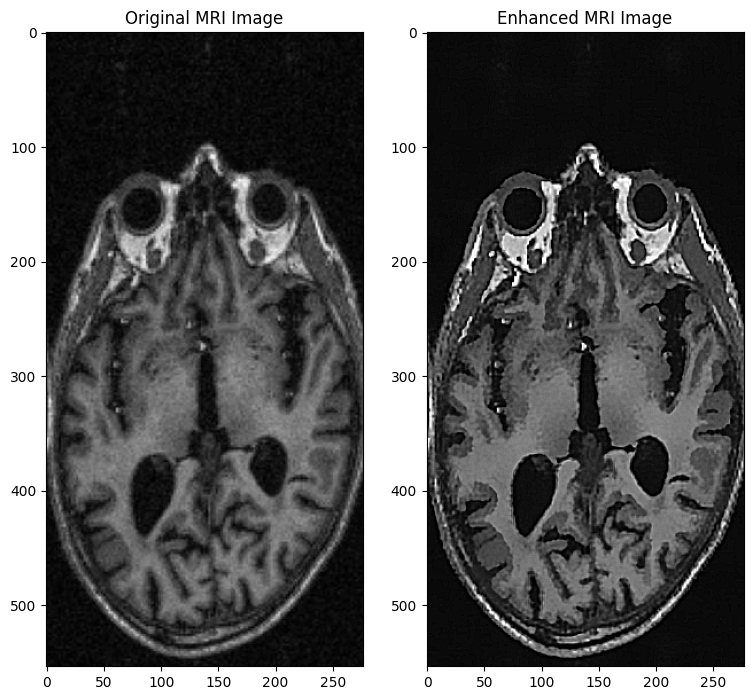

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(9, 9))
img_path = '/content/GAN-Traning Images/OAS2_0001_MR2_y_slice_105.jpg'
img1=mpimg.imread(img_path)
ax[0].imshow(img1 , cmap='gray')
ax[0].set_title('Original MRI Image')
ax[0].axis('on')
preprocessed_img = preprocess_image(img_path)
ax[1].imshow(preprocessed_img, cmap='gray')
ax[1].set_title('Enhanced MRI Image')
ax[1].axis('on')

plt.show()
ax[1].imshow(preprocessed_img, cmap='gray')
ax[1].set_title('Enhanced MRI Image')
ax[1].axis('on')

plt.show()


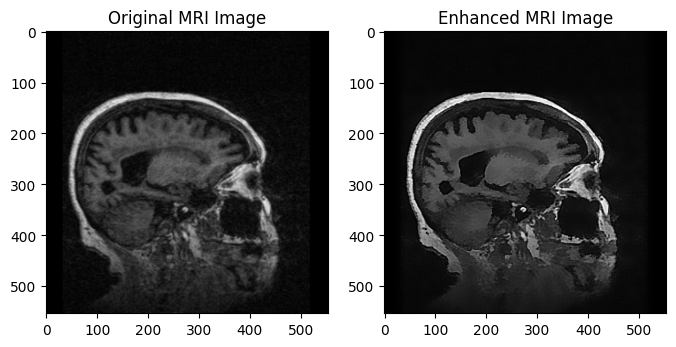

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(8,8))
img_path = '/content/GAN-Traning Images/OAS2_0023_MR2_z_slice_137.jpg'
img1=mpimg.imread(img_path)
ax[0].imshow(img1 , cmap='gray')
ax[0].set_title('Original MRI Image')
ax[0].axis('on')
preprocessed_img = preprocess_image(img_path)
ax[1].imshow(preprocessed_img, cmap='gray')
ax[1].set_title('Enhanced MRI Image')
ax[1].axis('on')

plt.show()
ax[1].imshow(preprocessed_img, cmap='gray')
ax[1].set_title('Enhanced MRI Image')
ax[1].axis('on')

plt.show()

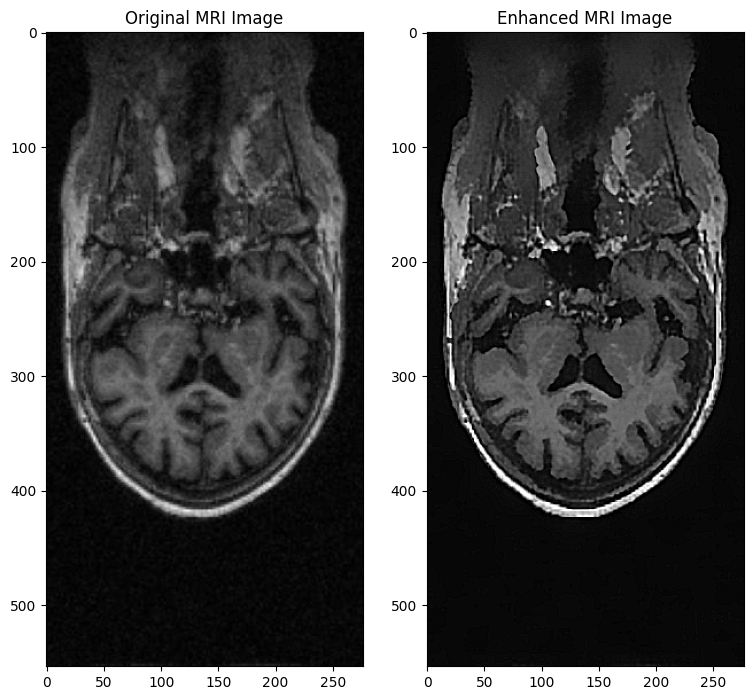

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(9, 9))
img_path = '/content/GAN-Traning Images/OAS2_0008_MR1_x_slice_134.jpg'
img1=mpimg.imread(img_path)
ax[0].imshow(img1 , cmap='gray')
ax[0].set_title('Original MRI Image')
ax[0].axis('on')
preprocessed_img = preprocess_image(img_path)
ax[1].imshow(preprocessed_img, cmap='gray')
ax[1].set_title('Enhanced MRI Image')
ax[1].axis('on')

plt.show()
ax[1].imshow(preprocessed_img, cmap='gray')
ax[1].set_title('Enhanced MRI Image')
ax[1].axis('on')

plt.show()

In [ ]:
image_dir = "/content/GAN-Traning Images"
output_dir = "/content/processed_images"

In [ ]:
preprocess_dataset(image_dir, output_dir)

In [ ]:
source_dir = '/content/processed_images'

In [ ]:
destination_dir = '/content/drive/MyDrive/out/output_brain'

In [ ]:
print("Length of destination directory : ",len(os.listdir(destination_dir)))

Length of destination directory :  14715


In [ ]:
import shutil
shutil.copytree(source_dir, destination_dir)

In [ ]:
def convert_to_tensor(img_path):
    img = Image.open(img_path).convert('L')
    transform = T.Compose([
        T.Resize((64, 64)),
        T.ToTensor(),
        T.Normalize((0.5,), (0.5,))
    ])

    img_tensor = transform(img)
    return img_tensor

In [ ]:
def load_and_convert_images(image_dir):
    tensors = []

    for img_name in os.listdir(image_dir):
        img_path = os.path.join(image_dir, img_name)
        img_tensor = convert_to_tensor(img_path)
        tensors.append(img_tensor)

    return tensors

In [ ]:
import torchvision.transforms as T
preprocessed_tensors = load_and_convert_images(destination_dir)

In [ ]:
from torch.utils.data import DataLoader, TensorDataset
preprocessed_dataset = TensorDataset(torch.stack(preprocessed_tensors))

In [ ]:
DATA_DIR = '/content/drive/MyDrive/out'
print(os.listdir(DATA_DIR))
device

['output_brain']


device(type='cuda')

In [ ]:
image_size=64
batch_size=128
stats=(0.5,0.5,0.5),(0.5,0.5,0.5)
device

device(type='cuda')

In [ ]:
from torchvision.datasets import ImageFolder
train_ds= ImageFolder(DATA_DIR,transform=T.Compose([T.Resize(image_size),T.CenterCrop(image_size),T.ToTensor(),T.Normalize(*stats)]))
train_dl =DataLoader(train_ds,batch_size,shuffle=True,num_workers=3,pin_memory=True)
device

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


device(type='cuda')

In [ ]:
def denorm(img_tensors):
  return img_tensors * stats[1][0]+stats[0][0]
device

device(type='cuda')

In [ ]:
def show_images(images,nmax=64):
  fig,ax=plt.subplots(figsize=(8,8))
  ax.set_xticks([]);
  ax.set_yticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]),nrow=8).permute(1,2,0))

def show_batch(dl,nmax=64):
  for images,_ in dl:
    show_images(images,nmax)
    break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


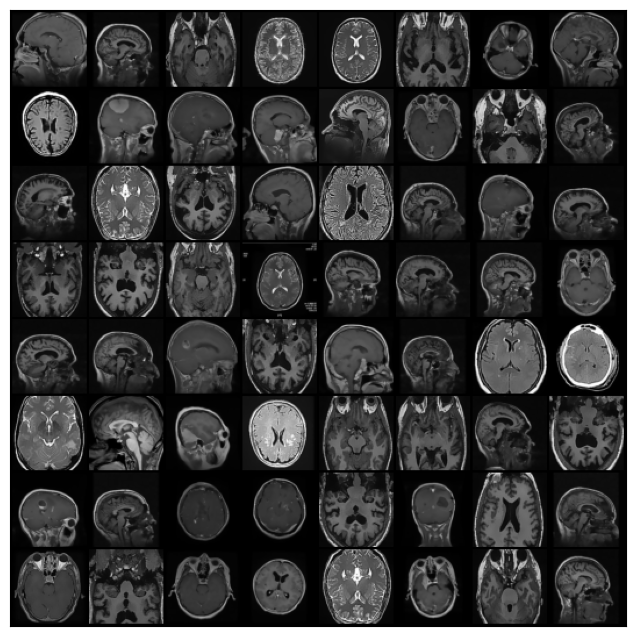

In [ ]:
show_batch(train_dl)

In [ ]:
discriminator =nn.Sequential(
    nn.Conv2d(3,64,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(64,128,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(128,256,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(256,512,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(512,1,kernel_size=4,stride=1,padding=0,bias=False),

    nn.Flatten(),
    nn.Sigmoid()
)
device

device(type='cuda')

In [ ]:
discriminator = to_device(discriminator,device)
device

device(type='cuda')

In [ ]:
latent_size=128
device

device(type='cuda')

In [ ]:
generator=nn.Sequential(
    nn.ConvTranspose2d(latent_size,512,kernel_size=4,stride=1,padding=0,bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),

    nn.ConvTranspose2d(512,256,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    nn.ConvTranspose2d(256,128,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),

    nn.ConvTranspose2d(128,64,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    nn.ConvTranspose2d(64,3,kernel_size=4,stride=2,padding=1,bias=False),
    nn.Tanh(),
)
device

device(type='cuda')

In [ ]:
xb=torch.randn(batch_size,latent_size,1,1)
print(xb.shape)
device

torch.Size([128, 128, 1, 1])


device(type='cuda')

torch.Size([128, 3, 64, 64])


device(type='cuda')

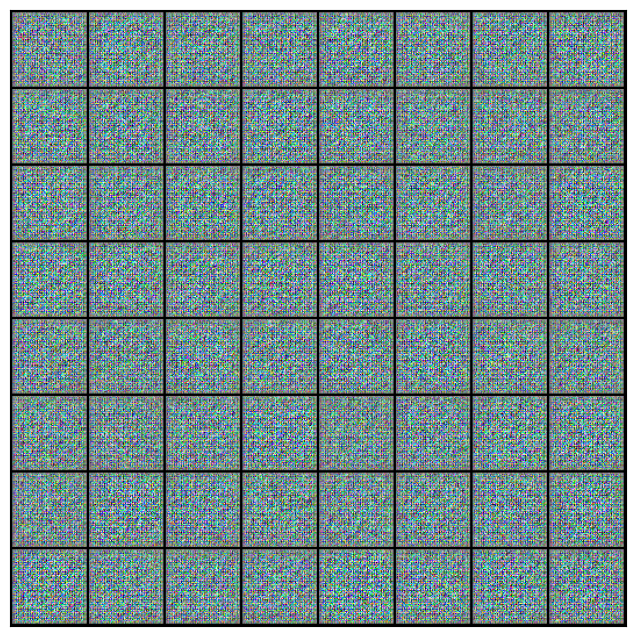

In [ ]:
fake_images=generator(xb)
print(fake_images.shape)
show_images(fake_images)
device

In [ ]:
generator=to_device(generator,device)

In [ ]:
def train_discriminator(real_images,opt_d):
  opt_d.zero_grad()
  real_images=real_images.to(device)
  real_preds= discriminator(real_images)
  real_targets=torch.ones(real_images.size(0),1,device=device)
  real_loss= F.binary_cross_entropy(real_preds,real_targets)
  real_score=torch.mean(real_preds).item()

  latent=torch.randn(batch_size,latent_size,1,1,device=device)
  fake_images=generator(latent)

  fake_targets= torch.zeros(fake_images.size(0),1,device=device)
  fake_preds= discriminator(fake_images)
  fake_loss= F.binary_cross_entropy(fake_preds,fake_targets)
  fake_score=torch.mean(fake_preds).item()

  loss=real_loss + fake_loss
  loss.backward()
  opt_d.step()
  return loss.item(),real_score,fake_score

In [ ]:
def train_generator(opt_g):
  opt_g.zero_grad()

  latent=torch.randn(batch_size,latent_size,1,1,device=device)
  fake_images=generator(latent)
  preds= discriminator(fake_images)
  targets=torch.ones(batch_size,1,device=device)
  loss= F.binary_cross_entropy(preds,targets)
  loss.backward()
  opt_g.step()
  return loss.item()

In [ ]:
sample_dir='generated'
os.makedirs(sample_dir,exist_ok=True)

In [ ]:
def save_samples(index,latent_tensors,show=True):
  fake_images=generator(latent_tensors)
  fake_fname='generated-images-{0:0=4d}.png'.format(index)
  save_image(denorm(fake_images),os.path.join(sample_dir,fake_fname),nrow=8)
  print('Saving',fake_fname)
  if show:
    fig,ax=plt.subplots(figsize=(8,8))
    ax.set_xticks([]);ax.set_yticks([])
    ax.imshow(make_grid(fake_images.cpu().detach(),nrow=8).permute(1,2,0))

In [ ]:
fixed_latent= torch.randn(64,latent_size,1,1,device=device)

Saving generated-images-0000.png


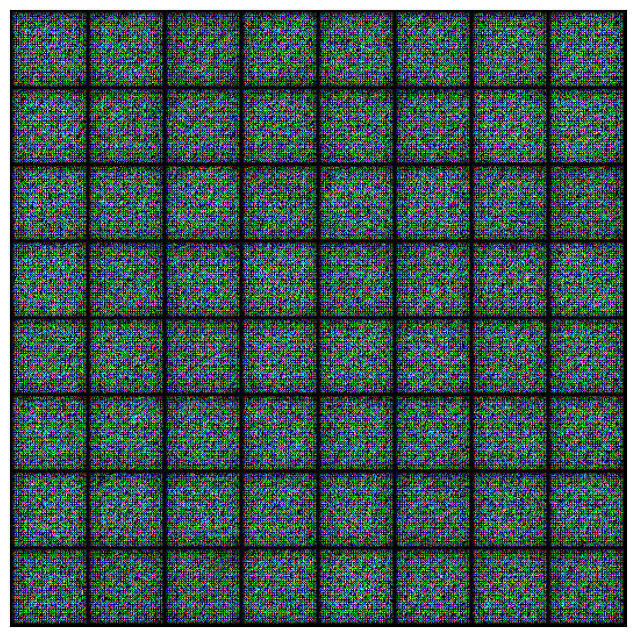

In [ ]:
save_samples(0,fixed_latent)

Saving generated-images-0010.png


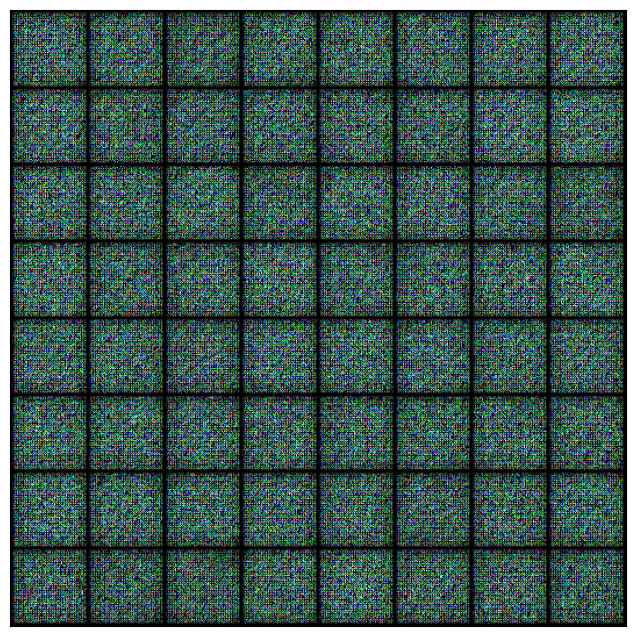

In [ ]:
save_samples(10,fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs,lr,start_idx=1):
  torch.cuda.empty_cache()
  losses_g=[]
  losses_d=[]
  real_scores=[]
  fake_scores=[]

  opt_d=torch.optim.Adam(discriminator.parameters(),lr=lr,betas=(0.5,0.999))
  opt_g=torch.optim.Adam(generator.parameters(),lr=lr,betas=(0.5,0.999))

  for epoch in range(epochs):
    for real_images, _ in tqdm(train_dl):
      loss_d,real_score,fake_score= train_discriminator(real_images,opt_d)
      loss_g = train_generator(opt_g)

    losses_g.append(loss_g)
    losses_d.append(loss_d)
    real_scores.append(real_score)
    fake_scores.append(fake_score)
    print("Epoch[{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

    save_samples(epoch+start_idx,fixed_latent,show=False)
  return losses_g,losses_d,real_scores,fake_scores

In [ ]:
lr =0.0002
epochs=17

In [ ]:
history= fit(epochs,lr)

  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[1/17], loss_g: 7.3415, loss_d: 0.7218, real_score: 0.7718, fake_score: 0.3353
Saving generated-images-0001.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[2/17], loss_g: 12.8574, loss_d: 1.5042, real_score: 0.9678, fake_score: 0.7186
Saving generated-images-0002.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[3/17], loss_g: 5.0512, loss_d: 0.2053, real_score: 0.8996, fake_score: 0.0661
Saving generated-images-0003.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[4/17], loss_g: 5.1076, loss_d: 0.1330, real_score: 0.9333, fake_score: 0.0553
Saving generated-images-0004.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[5/17], loss_g: 3.9753, loss_d: 0.0690, real_score: 0.9600, fake_score: 0.0203
Saving generated-images-0005.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[6/17], loss_g: 4.5729, loss_d: 0.2443, real_score: 0.9003, fake_score: 0.1061
Saving generated-images-0006.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[7/17], loss_g: 6.1061, loss_d: 0.1165, real_score: 0.9090, fake_score: 0.0129
Saving generated-images-0007.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[8/17], loss_g: 4.6456, loss_d: 0.2103, real_score: 0.9098, fake_score: 0.0887
Saving generated-images-0008.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[9/17], loss_g: 3.9556, loss_d: 0.0493, real_score: 0.9760, fake_score: 0.0234
Saving generated-images-0009.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[10/17], loss_g: 5.3960, loss_d: 0.1601, real_score: 0.9563, fake_score: 0.1042
Saving generated-images-0010.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[11/17], loss_g: 4.7135, loss_d: 0.1076, real_score: 0.9391, fake_score: 0.0377
Saving generated-images-0011.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[12/17], loss_g: 6.2039, loss_d: 0.3719, real_score: 0.7665, fake_score: 0.0020
Saving generated-images-0012.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[13/17], loss_g: 3.7276, loss_d: 0.2223, real_score: 0.9058, fake_score: 0.0968
Saving generated-images-0013.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[14/17], loss_g: 4.2908, loss_d: 0.1420, real_score: 0.9334, fake_score: 0.0579
Saving generated-images-0014.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[15/17], loss_g: 3.9972, loss_d: 0.1859, real_score: 0.9252, fake_score: 0.0923
Saving generated-images-0015.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[16/17], loss_g: 3.8854, loss_d: 0.1255, real_score: 0.9311, fake_score: 0.0469
Saving generated-images-0016.png


  0%|          | 0/115 [00:00<?, ?it/s]

Epoch[17/17], loss_g: 5.3594, loss_d: 0.1646, real_score: 0.9496, fake_score: 0.0947
Saving generated-images-0017.png


In [ ]:
losses_g,losses_d,real_scores,fake_scores=history

In [ ]:
torch.save(generator.state_dict(),'Generator.pth')
torch.save(discriminator.state_dict(),'Discriminator.pth')

In [ ]:
from IPython.display import Image

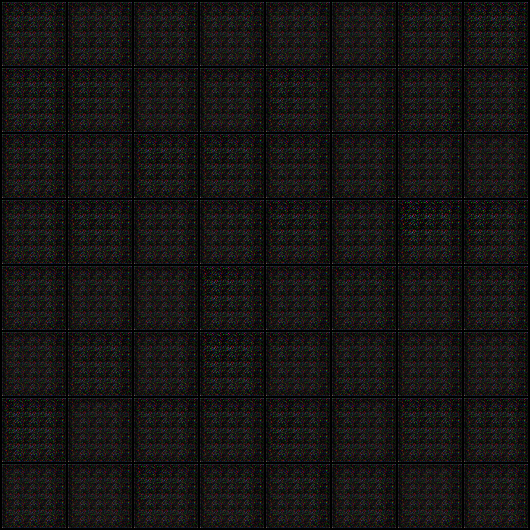

In [ ]:
Image('./generated/generated-images-0001.png')

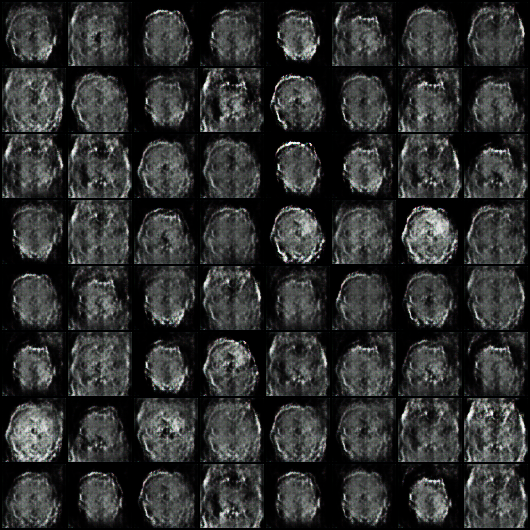

In [ ]:
Image('./generated/generated-images-0007.png')

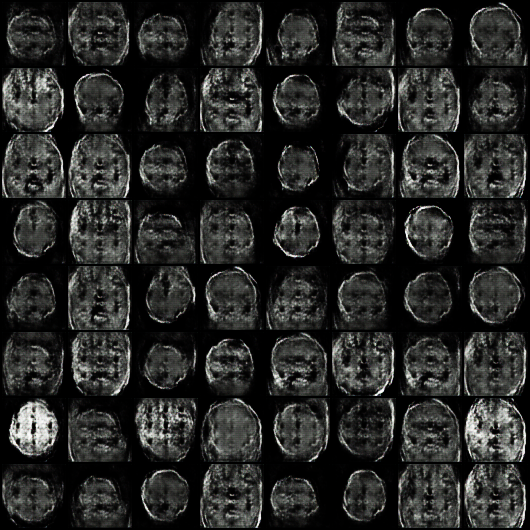

In [ ]:
Image('./generated/generated-images-0015.png')

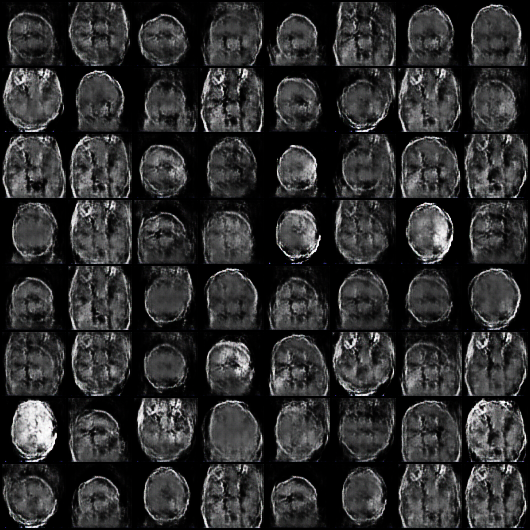

In [ ]:
Image('./generated/generated-images-0017.png')